# The DAX "Prophet"

* DAX = German index. Not the ETF named "DAX" (pitfall)
* Data source: FMP (you can use yfinance)


* Purpose of this NB: swing trade support (weeks)
* Model can detect seasonalities

## Data retrieval ($)

We want historical data for our model. 

This isn't free.

In [1]:
from openbb import obb
import os
from dotenv import load_dotenv

def read_api_keys_from_env():
    """
    Read API keys from env
    """
    load_dotenv("api_keys")  # This loads the variables from the file
    
    obb.user.credentials.nasdaq_api_key = os.getenv('NASDAQ_API_KEY') or print("NASDAQ_API_KEY is not set or empty") or None
    obb.user.credentials.fmp_api_key = os.getenv('FMP_API_KEY') or print("FMP_API_KEY is not set or empty") or None
    obb.user.credentials.econdb_api_key = os.getenv('ECONDB_API_KEY') or print("ECONDB_API_KEY is not set or empty") or None
    obb.user.credentials.fred_api_key = os.getenv('FRED_API_KEY') or print("FRED_API_KEY is not set or empty") or None
    obb.user.credentials.intrinio_api_key = os.getenv('INTRINIO_API_KEY') or print("INTRINIO_API_KEY is not set or empty") or None
    obb.user.credentials.polygon_api_key = os.getenv('POLYGON_API_KEY') or print("POLYGON_API_KEY is not set or empty") or None

    return os.getenv('ECONDB_API_KEY') 
    
ECONDB_API_KEY = read_api_keys_from_env()
# Need this API Key later for some data openbb doesn't support afaik

## Data download via Quant APIs

In [2]:
def get_dax_data(symbol : str):

    df_daily = obb.equity.price.historical(symbol = symbol, provider="fmp",start_date="2000-01-01").to_df()
    return df_daily

# https://site.financialmodelingprep.com/index-summary/%5EGDAXI 
# https://de.finance.yahoo.com/quote/%5EGDAXI/ 
df = get_dax_data("^GDAXI") # Not "DAX", which is an ETF

In [3]:
df.tail(1)

,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
date,,,,,,,,,,
2024-08-26,18589.9,18606.84,18554.51,18594.33,0,18585.23,18594.33,0.0,4.43,0.000238


In [4]:
df.head(1)

,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
date,,,,,,,,,,
2000-01-03,6961.720215,7159.330078,6720.870117,6750.759766,43072500,6876.98665,6750.759766,43072500.0,-210.96045,-0.0303


In [5]:
df.to_csv("GDAXI_Jan_2k_Aug24.csv")

# Load the data (local file)

* Data is present in the CSV

In [6]:
import pandas as pd


gdax_df = pd.read_csv("GDAXI_Jan_2k_Aug24.csv")

In [7]:
gdax_df.tail(1)

,date,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
6261,2024-08-26,18589.9,18606.84,18554.51,18594.33,0,18585.23,18594.33,0.0,4.43,0.000238


In [8]:
gdax_df.head(1)

,date,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
0,2000-01-03,6961.720215,7159.330078,6720.870117,6750.759766,43072500,6876.98665,6750.759766,43072500.0,-210.96045,-0.0303


# Data enrichment with Technical Analysis - why?

## We use a Kalman Filter for estimates

This is only one feature we will use later. The plot shows why.

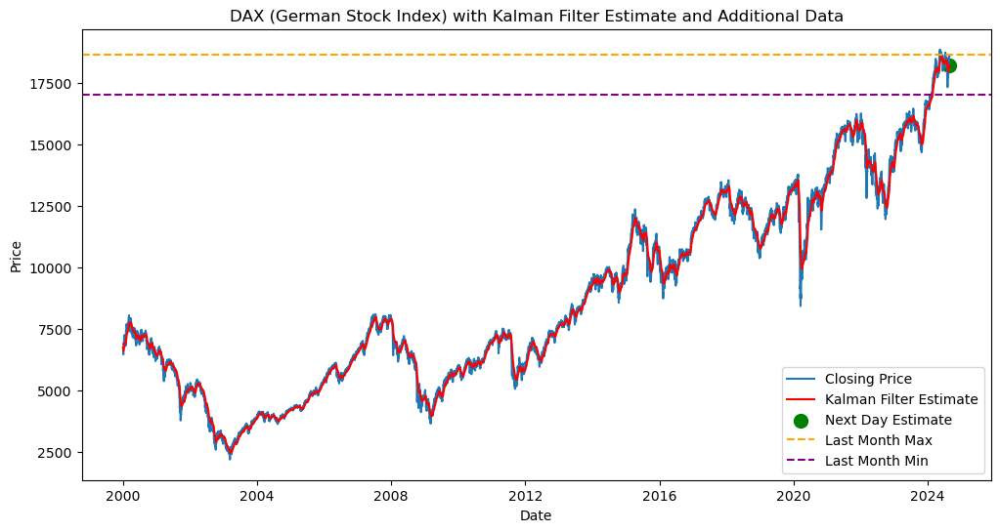

Last 5 days of complete data:
                  close  KalmanEstimate
date                                   
2024-08-21  18448.94922    18118.697662
2024-08-22  18493.39063    18154.340301
2024-08-23  18633.09961    18199.882243
2024-08-26  18594.33000    18237.404055
2024-08-27          NaN    18237.404055

Last complete day in dataset:
open    NaN
high    NaN
low     NaN
close   NaN
Name: 2024-08-27 00:00:00, dtype: float64

Next day estimate: 18237.40
Estimate uncertainty: 0.32

Last month's maximum price: 18670.45

Last month's minimum price: 17024.82

Data range: from 2000-01-03 to 2024-08-27

Current date and time: 2024-08-26 11:03:39.078629


In [173]:
import numpy as np
import pandas as pd
from pykalman import KalmanFilter
import matplotlib.pyplot as plt
from datetime import timedelta, datetime

# Read the DAX data from the CSV file
df = pd.read_csv("GDAXI_Jan_2k_Aug24.csv", parse_dates=['date'], index_col='date')

# Remove any rows with NaN values and get the latest complete day
df = df.dropna()
latest_complete_day = df.index[-1]

# Ensure we're only working with complete data up to the latest complete day
df = df[:latest_complete_day]

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Apply Kalman Filter
state_means, state_covariances = kf.filter(df['close'])

# Add Kalman Filter estimates to the dataframe
df['KalmanEstimate'] = state_means

# Get the next day estimate
last_mean = state_means[-1]
last_covariance = state_covariances[-1]
next_mean, next_covariance = kf.filter_update(
    filtered_state_mean=last_mean,
    filtered_state_covariance=last_covariance
)

# Add the next day estimate to the dataframe
next_day = latest_complete_day + timedelta(days=1)
df.loc[next_day, 'KalmanEstimate'] = next_mean[0]

# Calculate last month's max and min
last_month_start = latest_complete_day - timedelta(days=30)
last_month = df.loc[last_month_start:]
last_month_max = last_month['high'].max()
last_month_min = last_month['low'].min()

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['close'], label='Closing Price')
plt.plot(df.index, df['KalmanEstimate'], label='Kalman Filter Estimate', color='red')
plt.scatter(next_day, next_mean, color='green', s=100, label='Next Day Estimate')

# Add horizontal lines for last month's max and min
plt.axhline(y=last_month_max, color='orange', linestyle='--', label='Last Month Max')
plt.axhline(y=last_month_min, color='purple', linestyle='--', label='Last Month Min')

plt.title('DAX (German Stock Index) with Kalman Filter Estimate and Additional Data')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print the last few days of data and the next day estimate
print("Last 5 days of complete data:")
print(df[['close', 'KalmanEstimate']].tail())

print(f"\nLast complete day in dataset:")
print(df[['open', 'high', 'low', 'close']].iloc[-1])

print(f"\nNext day estimate: {next_mean[0]:.2f}")
print(f"Estimate uncertainty: {np.sqrt(next_covariance[0][0]):.2f}")

print(f"\nLast month's maximum price: {last_month_max:.2f}")
print(f"\nLast month's minimum price: {last_month_min:.2f}")

# Print the date range of the data
print(f"\nData range: from {df.index[0].date()} to {df.index[-1].date()}")

print(f"\nCurrent date and time: {datetime.now()}")

# Get foundational features ($)

We are going to enrich our dataset with

* Export stats
* Inflation

https://www.econdb.com/series/REXPDE/germany-real-exports-of-goods-and-services/?from=2019-08-25&to=2024-08-25 

We know DE is exporting a lot, and that DAX companies are export focused.
(For very adv. analysis, we could incorporate the cash flow etc. - all possible)

## RPXDE = Germany - Real exports of goods and services (Level USD)

These statistics aren't available since '91. 
We could go all out and merge certain other stats. But it doesn't seem to be necessary.

In [10]:
import pandas as pd

API_TOKEN = os.getenv('ECONDB_API_KEY')

export_stats_usd_de_df = pd.read_csv(
    'https://www.econdb.com/api/series/REXPDE~TUSD/?token=%s&format=csv' % API_TOKEN,
    index_col='Date', parse_dates=['Date'])

In [11]:
export_stats_usd_de_df.tail(1)

,REXPDE~TUSD
Date,
2024-01-01,441754.0


In [12]:
export_stats_usd_de_df.head(1)

,REXPDE~TUSD
Date,
1991-01-01,NaN


## CPI = Germany - Consumer Price Index (Level USD)

Here the stats timeframe is also limited. 

In [13]:
import pandas as pd

API_TOKEN = os.getenv('ECONDB_API_KEY')

consumer_price_index_usd_de_df = pd.read_csv(
    'https://www.econdb.com/api/series/CPIDE~TUSD/?token=%s&format=csv' % API_TOKEN,
    index_col='Date', parse_dates=['Date'])

In [14]:
consumer_price_index_usd_de_df.head(1)

,CPIDE~TUSD
Date,
2012-03-01,121.23


In [15]:
consumer_price_index_usd_de_df.tail(1)

,CPIDE~TUSD
Date,
2024-07-01,130.25


# Combine the datasets

In [16]:
import pandas as pd

# Ensure export_stats_usd_de_df and consumer_price_index_de_df have datetime index
export_stats_usd_de_df.index = pd.to_datetime(export_stats_usd_de_df.index)
consumer_price_index_usd_de_df.index = pd.to_datetime(consumer_price_index_usd_de_df.index)

In [17]:
export_stats_usd_de_df.tail(5)

,REXPDE~TUSD
Date,
2023-01-01,442621.0
2023-04-01,448084.0
2023-07-01,441556.0
2023-10-01,433233.0
2024-01-01,441754.0


In [18]:
consumer_price_index_usd_de_df.tail(5)

,CPIDE~TUSD
Date,
2024-03-01,128.78
2024-04-01,127.67
2024-05-01,129.23
2024-06-01,128.45
2024-07-01,130.25


In [19]:
# Ensure export_stats_usd_de_df and consumer_price_index_de_df have datetime index
export_stats_usd_de_df.index = pd.to_datetime(export_stats_usd_de_df.index)
consumer_price_index_usd_de_df.index = pd.to_datetime(consumer_price_index_usd_de_df.index)

# Resample export_stats_usd_de_df to daily frequency and forward fill
export_stats_daily = export_stats_usd_de_df.resample('D').ffill()

# Resample consumer_price_index_de_df to daily frequency and forward fill
cpi_daily = consumer_price_index_usd_de_df.resample('D').ffill()

In [20]:
export_stats_daily.tail(5)

,REXPDE~TUSD
Date,
2023-12-28,433233.0
2023-12-29,433233.0
2023-12-30,433233.0
2023-12-31,433233.0
2024-01-01,441754.0


In [21]:
cpi_daily.tail(5)

,CPIDE~TUSD
Date,
2024-06-27,128.45
2024-06-28,128.45
2024-06-29,128.45
2024-06-30,128.45
2024-07-01,130.25


In [22]:
gdax_df.tail(5)

,date,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
6257,2024-08-20,18473.23047,18495.27930,18349.98047,18357.51953,42912000,18419.00,18357.51953,42912000.0,-115.71094,-0.006264
6258,2024-08-21,18358.78906,18476.63086,18352.18945,18448.94922,36068100,18409.14,18448.94922,36068100.0,90.16016,0.004911
6259,2024-08-22,18459.27930,18551.39063,18458.60938,18493.39063,40950900,18490.67,18493.39063,40950900.0,34.11133,0.001848
6260,2024-08-23,18538.86914,18670.44922,18519.28906,18633.09961,41122500,18590.43,18633.09961,41122500.0,94.23047,0.005083
6261,2024-08-26,18589.90000,18606.84000,18554.51000,18594.33000,0,18585.23,18594.33000,0.0,4.43000,0.000238


In [23]:
import pandas as pd

# Assuming the Date columns are the index in export_stats_daily and cpi_daily
# and 'date' column in gdax_df is not an index

# Set the 'date' column in gdax_df to be the index
gdax_df.set_index('date', inplace=True)

# Merge the dataframes on the index
combined_df = pd.concat([export_stats_daily, cpi_daily, gdax_df], axis=1, join='outer')

# Forward fill missing values
combined_df.ffill(inplace=True)

# Reset the index if needed
combined_df.reset_index(inplace=True)

# Show the last few rows of the combined dataframe
print(combined_df.tail())


            index  REXPDE~TUSD  CPIDE~TUSD         open         high  \
18493  2024-08-20     441754.0      130.25  18473.23047  18495.27930   
18494  2024-08-21     441754.0      130.25  18358.78906  18476.63086   
18495  2024-08-22     441754.0      130.25  18459.27930  18551.39063   
18496  2024-08-23     441754.0      130.25  18538.86914  18670.44922   
18497  2024-08-26     441754.0      130.25  18589.90000  18606.84000   

               low        close      volume      vwap    adj_close  \
18493  18349.98047  18357.51953  42912000.0  18419.00  18357.51953   
18494  18352.18945  18448.94922  36068100.0  18409.14  18448.94922   
18495  18458.60938  18493.39063  40950900.0  18490.67  18493.39063   
18496  18519.28906  18633.09961  41122500.0  18590.43  18633.09961   
18497  18554.51000  18594.33000         0.0  18585.23  18594.33000   

       unadjusted_volume     change  change_percent  
18493         42912000.0 -115.71094       -0.006264  
18494         36068100.0   90.16016   

In [24]:
combined_df.tail(5)

,index,REXPDE~TUSD,CPIDE~TUSD,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
18493,2024-08-20,441754.0,130.25,18473.23047,18495.27930,18349.98047,18357.51953,42912000.0,18419.00,18357.51953,42912000.0,-115.71094,-0.006264
18494,2024-08-21,441754.0,130.25,18358.78906,18476.63086,18352.18945,18448.94922,36068100.0,18409.14,18448.94922,36068100.0,90.16016,0.004911
18495,2024-08-22,441754.0,130.25,18459.27930,18551.39063,18458.60938,18493.39063,40950900.0,18490.67,18493.39063,40950900.0,34.11133,0.001848
18496,2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,18633.09961,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083
18497,2024-08-26,441754.0,130.25,18589.90000,18606.84000,18554.51000,18594.33000,0.0,18585.23,18594.33000,0.0,4.43000,0.000238


In [174]:
combined_df.head(1)

,index,REXPDE~TUSD,CPIDE~TUSD,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
0,1991-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
combined_df.tail(2)

,index,REXPDE~TUSD,CPIDE~TUSD,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent
18496,2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,18633.09961,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083
18497,2024-08-26,441754.0,130.25,18589.90000,18606.84000,18554.51000,18594.33000,0.0,18585.23,18594.33000,0.0,4.43000,0.000238


# Calculation of a volatility-based indicator (Lorentzian) and the Kalman estimation

Target: close price.

In [176]:
c_df = combined_df.copy()
c_df = c_df.tail(10 * 365)
nan_counts = c_df.isna().sum()
print(nan_counts)

# Assuming your dataframe is named combined_df
df = c_df.copy()
df['date'] = pd.to_datetime(df['index'])
# Set 'date' as the index
df.set_index('date', inplace=True)

# Remove the original 'index' column
df = df.drop('index', axis=1)

index                0
REXPDE~TUSD          0
CPIDE~TUSD           0
open                 0
high                 0
low                  0
close                0
volume               0
vwap                 0
adj_close            0
unadjusted_volume    0
change               0
change_percent       0
dtype: int64


## Data enrichment - extra columns

In [178]:
import pandas as pd
import numpy as np
from pykalman import KalmanFilter
import talib

# Function to calculate Lorentzian indicator
def calculate_lorentzian(data, period=14):
    high_low = data['high'] - data['low']
    high_close = np.abs(data['high'] - data['close'].shift())
    low_close = np.abs(data['low'] - data['close'].shift())
    ranges = pd.concat([high_low, high_close, low_close], axis=1)
    true_range = np.max(ranges, axis=1)
    atr = talib.SMA(true_range, timeperiod=period)
    lorentzian = np.log(1 + atr)
    return lorentzian

# Assuming c_df is your DAX data
# Ensure c_df has 'date' as index and contains 'open', 'high', 'low', 'close' columns

# Calculate Kalman Filter estimates
kf = KalmanFilter(
    initial_state_mean=c_df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)


state_means, _ = kf.filter(c_df['close'])
c_df['KalmanEstimate'] = state_means

# Calculate Lorentzian indicator
c_df['LorentzianIndicator'] = calculate_lorentzian(c_df)

In [179]:
print(c_df.tail(5))

            index  REXPDE~TUSD  CPIDE~TUSD         open         high  \
18493  2024-08-20     441754.0      130.25  18473.23047  18495.27930   
18494  2024-08-21     441754.0      130.25  18358.78906  18476.63086   
18495  2024-08-22     441754.0      130.25  18459.27930  18551.39063   
18496  2024-08-23     441754.0      130.25  18538.86914  18670.44922   
18497  2024-08-26     441754.0      130.25  18589.90000  18606.84000   

               low        close      volume      vwap    adj_close  \
18493  18349.98047  18357.51953  42912000.0  18419.00  18357.51953   
18494  18352.18945  18448.94922  36068100.0  18409.14  18448.94922   
18495  18458.60938  18493.39063  40950900.0  18490.67  18493.39063   
18496  18519.28906  18633.09961  41122500.0  18590.43  18633.09961   
18497  18554.51000  18594.33000         0.0  18585.23  18594.33000   

       unadjusted_volume     change  change_percent  KalmanEstimate  \
18493         42912000.0 -115.71094       -0.006264    18083.979993   
1849

# Now we (over)fit Prophet

* Prophet is an ML model based on additive regression with Fourier series
* Can be used for seasonality and a piecewise linear trend. As you know, people do intraday trades, cyclical swings. That's also because Wall Street algorithms close after certain days of trade
* Besides that, there are macroeconomic seasonalities: yearly reports (with dividend etc.). The German DAX is a performance index.

https://facebook.github.io/prophet/ 

(an actual implementation is below)

We use 10 years "only". Overfit... depends. This is a difficult aspect beyond the NB.

## Prophet model for the next day

* This can infer the close price for the next day.
* Keep in mind: we did not take care of the weekends. The data is limited. Etc. pp.
* We use the consumer price index and the real-exports of goods for Germany because we know Germany exports a lot
* We do not use other data because more data isn't always better. The feature engineering, however, is key

In conclusion: we can do better. 

This is also a model you'd retrain every day. You can automate that, after the market closes. It takes 2 mins.

In [198]:
df = c_df.copy()
df['date'] = pd.to_datetime(df['index'])
# Set 'date' as the index
df.set_index('date', inplace=True)

# Remove the original 'index' column
df = df.drop('index', axis=1)

In [199]:
df.columns

Index(['REXPDE~TUSD', 'CPIDE~TUSD', 'open', 'high', 'low', 'close', 'volume',
       'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent',
       'KalmanEstimate', 'LorentzianIndicator'],
      dtype='object')

## Training for the next-day prediction with fully-fitted 10y data

Note: close gets inferred, features get estimated. This is synthetic data.

Meaning: it's just another indicator.

In [201]:
from prophet import Prophet
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Define the expected columns
expected_columns = ['REXPDE~TUSD', 'CPIDE~TUSD', 'open', 'high', 'low', 'close', 'volume',
                    'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent',
                    'KalmanEstimate', 'LorentzianIndicator']

# Assert that all expected columns are present in the DataFrame
assert all(col in df.columns for col in expected_columns), f"Missing columns. Expected: {expected_columns}, Got: {df.columns.tolist()}"

# Remove rows with NaN values
df = df.dropna()

df['ds'] = df.index
df['y'] = df["close"]
df = df.drop(columns=['close'])

df.tail(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,volume,vwap,adj_close,unadjusted_volume,change,change_percent,KalmanEstimate,LorentzianIndicator,ds,y
date,,,,,,,,,,,,,,,
2024-08-13,441754.0,130.25,17799.66016,17817.07031,17669.64063,0.0,17774.61,17812.05078,0.0,12.39062,0.000696,17971.884663,5.629366,2024-08-13,17812.05078
2024-08-14,441754.0,130.25,17882.17969,17921.99023,17827.08008,0.0,17879.21,17885.59961,0.0,3.41992,0.000191,17963.676804,5.581875,2024-08-14,17885.59961
2024-08-15,441754.0,130.25,17977.81055,18198.08984,17909.74023,0.0,18067.22,18183.24023,0.0,205.42968,0.011400,17984.562758,5.608979,2024-08-15,18183.24023
2024-08-16,441754.0,130.25,18236.01953,18344.22070,18226.59961,63794900.0,18282.31,18322.40039,63794900.0,86.38086,0.004737,18016.699536,5.588865,2024-08-16,18322.40039
2024-08-19,441754.0,130.25,18312.50977,18454.93945,18284.85938,43769700.0,18368.50,18421.68945,43769700.0,109.17968,0.005962,18055.224170,5.594636,2024-08-19,18421.68945
2024-08-20,441754.0,130.25,18473.23047,18495.27930,18349.98047,42912000.0,18419.00,18357.51953,42912000.0,-115.71094,-0.006264,18083.979993,5.592532,2024-08-20,18357.51953
2024-08-21,441754.0,130.25,18358.78906,18476.63086,18352.18945,36068100.0,18409.14,18448.94922,36068100.0,90.16016,0.004911,18118.697662,5.505103,2024-08-21,18448.94922
2024-08-22,441754.0,130.25,18459.27930,18551.39063,18458.60938,40950900.0,18490.67,18493.39063,40950900.0,34.11133,0.001848,18154.340301,5.395760,2024-08-22,18493.39063
2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083,18199.882243,5.234629,2024-08-23,18633.09961


In [202]:
# Define potential regressors (all columns except 'ds' and 'y')
regressors = [col for col in df.columns if col not in ['ds', 'y']]

def train_prophet_model(df, regressors, include_monthly_seasonality=True):
    model = Prophet(
        yearly_seasonality=True,
        daily_seasonality=True,
        weekly_seasonality=True,
        changepoint_prior_scale=0.05,
        seasonality_prior_scale=10.0,
        seasonality_mode='additive'
    )
    
    if include_monthly_seasonality:
        model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    
    for regressor in regressors:
        if regressor in df.columns:
            model.add_regressor(regressor)
    
    model.fit(df)
    return model

# Filter regressors to only include those present in the dataframe
regressors = [reg for reg in regressors if reg in df.columns]
print(f"Using regressors: {regressors}")

# Train the model
model = train_prophet_model(df, regressors)

# Save model and data for future use
df.to_pickle('dax_data.pkl')
import pickle
with open('prophet_model.pkl', 'wb') as f:
    pickle.dump(model, f)

print("Model training completed and saved.")

Using regressors: ['REXPDE~TUSD', 'CPIDE~TUSD', 'open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator']


11:14:51 - cmdstanpy - INFO - Chain [1] start processing
11:14:51 - cmdstanpy - INFO - Chain [1] done processing
11:14:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
11:14:52 - cmdstanpy - INFO - Chain [1] start processing
11:19:29 - cmdstanpy - INFO - Chain [1] done processing


Model training completed and saved.



Model Results:
Root Mean Squared Error: 4.8653376964947
Mean Absolute Error: 4.844596361038675


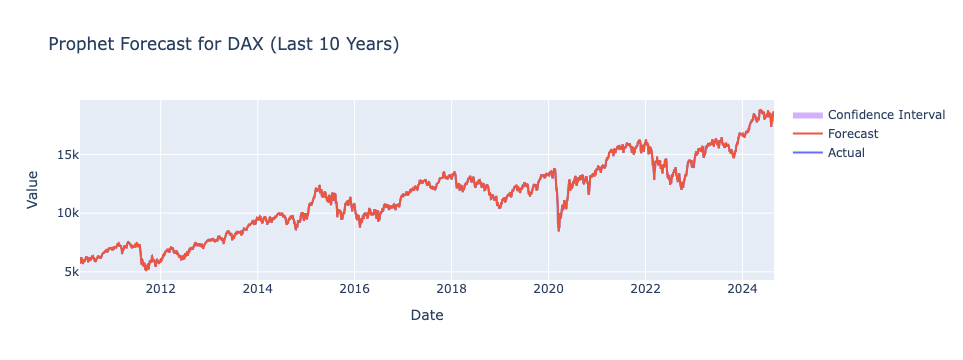

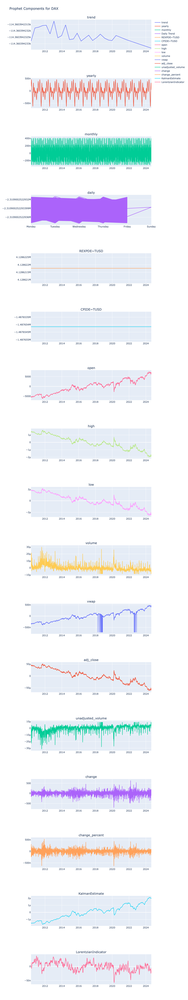


Regressor Importance:
              regressor    importance
1            CPIDE~TUSD  6.899540e-12
10       change_percent  6.475170e-12
5                volume  6.237060e-12
9                change  5.750970e-12
6                  vwap  5.310740e-12
7             adj_close  3.649940e-12
4                   low  3.004260e-12
2                  open  2.820480e-12
8     unadjusted_volume  2.210480e-12
0           REXPDE~TUSD  1.872200e-12
3                  high  1.223010e-12
11       KalmanEstimate  1.184880e-12
12  LorentzianIndicator  3.815220e-13


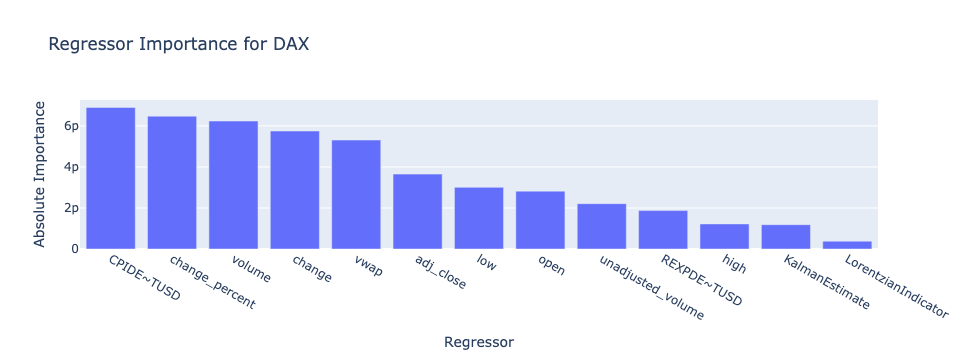

In [203]:
import pandas as pd
import pickle
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.metrics import mean_squared_error, mean_absolute_error
from datetime import datetime

with open('prophet_model.pkl', 'rb') as f:
    model = pickle.load(f)

# Get current date
current_date = datetime.now().date()

# Make predictions up to the current date
future = model.make_future_dataframe(periods=0)  # No future predictions
future = future.merge(df[['ds'] + [col for col in df.columns if col not in ['ds', 'y']]], on='ds', how='left')
forecast = model.predict(future)

# Evaluate the model
y_true = df['y'].values
y_pred = forecast['yhat'].values
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)

print(f"\nModel Results:")
print(f"Root Mean Squared Error: {rmse}")
print(f"Mean Absolute Error: {mae}")

# Plot the results with Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))
fig.update_layout(title='Prophet Forecast for DAX (Last 10 Years)', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Plot component-wise effects including daily trend
component_names = ['trend', 'yearly', 'monthly', 'daily'] + [col for col in df.columns if col not in ['ds', 'y']]
fig = make_subplots(rows=len(component_names), cols=1, subplot_titles=component_names)

for i, component in enumerate(component_names, 1):
    if component == 'daily':
        daily_trend = forecast[['ds', 'daily']].copy()  # Use .copy() to avoid SettingWithCopyWarning
        daily_trend['day_of_week'] = daily_trend['ds'].dt.day_name()
        fig.add_trace(go.Scatter(x=daily_trend['day_of_week'], y=daily_trend['daily'], mode='lines', name='Daily Trend'), row=i, col=1)
    else:
        fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast[component], mode='lines', name=component), row=i, col=1)

fig.update_layout(height=300*len(component_names), title_text="Prophet Components for DAX", hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

# Analyze regressor importance
if regressors:
    beta_values = model.params['beta'].flatten()
    regressor_importance = pd.DataFrame({
        'regressor': regressors,
        'importance': np.abs(beta_values[:len(regressors)])
    })
    regressor_importance = regressor_importance.sort_values('importance', ascending=False)
    print("\nRegressor Importance:")
    print(regressor_importance)

    # Plot regressor importance
    fig = go.Figure([go.Bar(x=regressor_importance['regressor'], y=regressor_importance['importance'])])
    fig.update_layout(title='Regressor Importance for DAX', xaxis_title='Regressor', yaxis_title='Absolute Importance')
    fig.show()
else:
    print("\nNo regressors were included in the model.")

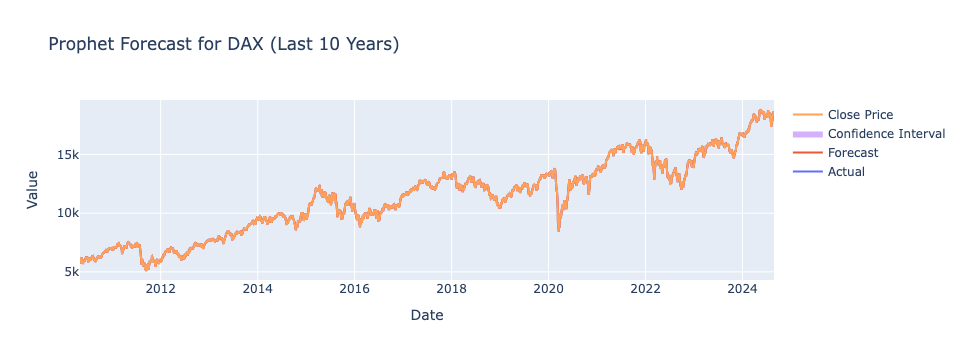

In [205]:
# Plot the results with Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))

# Add the c_df["close"] plot
fig.add_trace(go.Scatter(x=c_df['index'], y=c_df['close'], mode='lines', name='Close Price'))

fig.update_layout(title='Prophet Forecast for DAX (Last 10 Years)', xaxis_title='Date', yaxis_title='Value', hovermode='x unified')
fig.update_xaxes(range=[df['ds'].min(), current_date])
fig.show()

## Prediction of the DAX price of the next day based on the features: Real Exports DE, Volatility (Lorentzian) in addition to the prices 

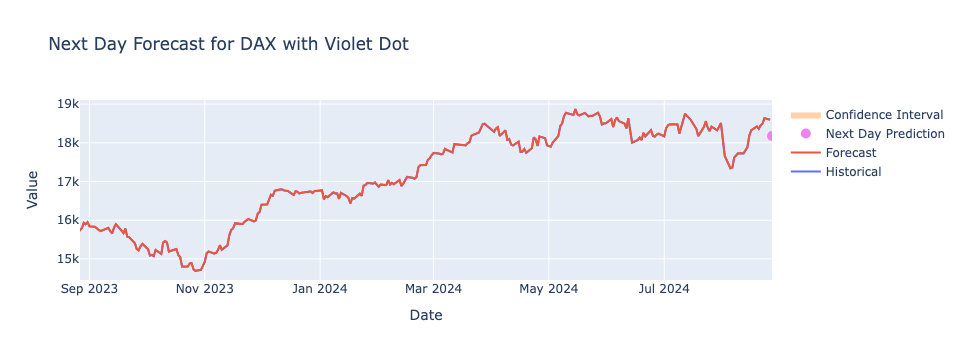


Future Prediction for the next day:
          ds          yhat    yhat_lower    yhat_upper
0 2024-08-27  18175.712708  18175.712699  18175.712716


In [206]:
import pandas as pd
import pickle
from datetime import datetime, timedelta
import plotly.graph_objects as go

# Assuming your dataframe is named combined_df
df = c_df.copy()

# Convert 'index' to datetime if it's not already
df['index'] = pd.to_datetime(df['index'])

# Filter for the last 10 years of data
ten_years_ago = datetime.now() - timedelta(days=365*10)
df = df[df['index'] >= ten_years_ago]

# Remove rows with NaN values
df = df.dropna()

# Rename columns to match Prophet's requirements
df = df.rename(columns={'index': 'ds', 'close': 'y'})

# Define potential regressors (all columns except 'ds' and 'y')
regressors = [col for col in df.columns if col not in ['ds', 'y']]

with open('prophet_model.pkl', 'rb') as f:
    model = pickle.load(f)

# Get current date
current_date = datetime.now().date()

# Predict for the next day
future_dates = pd.date_range(start=current_date + timedelta(days=1), periods=1)
future_df = pd.DataFrame({'ds': future_dates})

# Initialize future_df with estimated regressor values (mean of the last 30 days)
regressors = [col for col in df.columns if col not in ['ds', 'y']]
for regressor in regressors:
    future_df[regressor] = df[regressor].tail(30).mean()

# Make the prediction for the next day
future_forecast = model.predict(future_df)

# Plot historical data and the next day's forecast with a violet dot
fig = go.Figure()

# Plot the actual historical data
fig.add_trace(go.Scatter(x=df['ds'].tail(365), y=df['y'].tail(365), mode='lines', name='Historical'))

# Plot the forecast line (without predictions)
fig.add_trace(go.Scatter(x=df['ds'].tail(365), y=model.predict(df.tail(365)[['ds'] + regressors])['yhat'], mode='lines', name='Forecast'))

# Plot the violet dot for the next day's prediction
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat'], mode='markers', name='Next Day Prediction', marker=dict(color='violet', size=10, symbol='circle')))

# Plot the confidence interval for the next day's prediction
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=future_forecast['ds'], y=future_forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))

# Update layout
fig.update_layout(title='Next Day Forecast for DAX with Violet Dot',
                  xaxis_title='Date',
                  yaxis_title='Value',
                  hovermode='x unified')
fig.update_xaxes(range=[current_date - timedelta(days=365), future_dates[-1]])

# Show the plot
fig.show()

# Print the future prediction
print("\nFuture Prediction for the next day:")
print(future_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])


## Training of the same Prophet model for the next month (Swing trade)

* the definition: Swing trades go for a timeframe of weeks. Intraday trades for a day at max.

For Swing trades, you should look at this with seasonalities.

https://app.seasonax.com/assets/gdaxi-ind?h=eJyrVkpUsjI0NtFRKipWslIyMjA0MbAwMlYC8lPBfCMYv1LJKjpWRykXqFxHKUXJykBHKbkMSNUCAABiD0U%3D 


In [207]:
df = c_df.copy()
df['date'] = pd.to_datetime(df['index'])
# Set 'date' as the index
df.set_index('date', inplace=True)

# Remove the original 'index' column
df = df.drop('index', axis=1)

In [208]:
from prophet import Prophet
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Define the expected columns
expected_columns = ['REXPDE~TUSD', 'CPIDE~TUSD', 'open', 'high', 'low', 'close', 'volume',
                    'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent',
                    'KalmanEstimate', 'LorentzianIndicator']

# Assert that all expected columns are present in the DataFrame
assert all(col in df.columns for col in expected_columns), f"Missing columns. Expected: {expected_columns}, Got: {df.columns.tolist()}"

# Remove rows with NaN values
df = df.dropna()

df['ds'] = df.index
df['y'] = df["close"]
df = df.drop(columns=['close'])

df.tail(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,volume,vwap,adj_close,unadjusted_volume,change,change_percent,KalmanEstimate,LorentzianIndicator,ds,y
date,,,,,,,,,,,,,,,
2024-08-13,441754.0,130.25,17799.66016,17817.07031,17669.64063,0.0,17774.61,17812.05078,0.0,12.39062,0.000696,17971.884663,5.629366,2024-08-13,17812.05078
2024-08-14,441754.0,130.25,17882.17969,17921.99023,17827.08008,0.0,17879.21,17885.59961,0.0,3.41992,0.000191,17963.676804,5.581875,2024-08-14,17885.59961
2024-08-15,441754.0,130.25,17977.81055,18198.08984,17909.74023,0.0,18067.22,18183.24023,0.0,205.42968,0.011400,17984.562758,5.608979,2024-08-15,18183.24023
2024-08-16,441754.0,130.25,18236.01953,18344.22070,18226.59961,63794900.0,18282.31,18322.40039,63794900.0,86.38086,0.004737,18016.699536,5.588865,2024-08-16,18322.40039
2024-08-19,441754.0,130.25,18312.50977,18454.93945,18284.85938,43769700.0,18368.50,18421.68945,43769700.0,109.17968,0.005962,18055.224170,5.594636,2024-08-19,18421.68945
2024-08-20,441754.0,130.25,18473.23047,18495.27930,18349.98047,42912000.0,18419.00,18357.51953,42912000.0,-115.71094,-0.006264,18083.979993,5.592532,2024-08-20,18357.51953
2024-08-21,441754.0,130.25,18358.78906,18476.63086,18352.18945,36068100.0,18409.14,18448.94922,36068100.0,90.16016,0.004911,18118.697662,5.505103,2024-08-21,18448.94922
2024-08-22,441754.0,130.25,18459.27930,18551.39063,18458.60938,40950900.0,18490.67,18493.39063,40950900.0,34.11133,0.001848,18154.340301,5.395760,2024-08-22,18493.39063
2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083,18199.882243,5.234629,2024-08-23,18633.09961


In [214]:
# Filter the data to include only the 1st day of each month
df_monthly = df[df.index.is_month_start]
df_monthly.tail(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,volume,vwap,adj_close,unadjusted_volume,change,change_percent,KalmanEstimate,LorentzianIndicator,ds,y
date,,,,,,,,,,,,,,,
2023-03-01,441754.0,130.25,15399.910000,15478.840000,15254.110000,0.0,15345.99,15305.020000,0.0,-94.89000,-0.006162,15331.766332,5.287906,2023-03-01,15305.020000
2023-06-01,441754.0,130.25,15744.009766,15863.410156,15734.860352,55198400.0,15817.31,15853.660156,55198400.0,109.65039,0.006965,15905.620678,5.203303,2023-06-01,15853.660156
2023-08-01,441754.0,130.25,16414.790000,16430.660000,16240.400000,63456600.0,16331.56,16240.400000,63456600.0,-174.39000,-0.010600,16168.974423,4.987172,2023-08-01,16240.400000
2023-09-01,441754.0,130.25,15936.340000,15984.590000,15840.250000,54045200.0,15900.38,15840.340000,54045200.0,-96.00000,-0.006024,15837.369239,5.117887,2023-09-01,15840.340000
2023-11-01,441754.0,130.25,14851.959960,14949.580080,14786.320310,63588700.0,14877.78,14923.269530,63588700.0,71.30957,0.004801,15006.478530,5.170565,2023-11-01,14923.269530
2023-12-01,441754.0,130.25,16296.919920,16399.060550,16279.450200,68139400.0,16343.24,16397.519530,68139400.0,100.59961,0.006173,15817.485596,4.820172,2023-12-01,16397.519530
2024-02-01,441754.0,130.25,16834.130860,16915.919920,16821.599610,89451400.0,16857.67,16859.039060,89451400.0,24.90820,0.001480,16760.450346,4.955344,2024-02-01,16859.039060
2024-03-01,441754.0,130.25,17793.470700,17816.519530,17690.890620,85782600.0,17758.99,17735.070310,85782600.0,-58.40039,-0.003282,17263.902638,4.850206,2024-03-01,17735.070310
2024-07-01,441754.0,130.25,18286.859380,18286.859380,18030.490230,57146800.0,18192.07,18290.660160,55846500.0,-122.79883,-0.006715,18279.588897,5.398728,2024-07-01,18164.060550


In [215]:
from prophet import Prophet
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Remove rows with NaN values
df = df_monthly.dropna()

# Define potential regressors (all columns except 'ds' and 'y')
regressors = [col for col in df.columns if col not in ['ds', 'y']]

def train_prophet_model(df, regressors, include_monthly_seasonality=True):
    model = Prophet(
        yearly_seasonality=True,
        daily_seasonality=False,  # Daily seasonality is unnecessary if we only have one day per month
        weekly_seasonality=False, # Weekly seasonality is unnecessary if we only have one day per month
        changepoint_prior_scale=0.05,
        seasonality_prior_scale=10.0,
        seasonality_mode='additive'
    )
    
    if include_monthly_seasonality:
        model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    
    for regressor in regressors:
        if regressor in df.columns:
            model.add_regressor(regressor)
    
    model.fit(df)
    return model

# Filter regressors to only include those present in the dataframe
regressors = [reg for reg in regressors if reg in df.columns]
print(f"Using regressors: {regressors}")

# Train the model
model = train_prophet_model(df, regressors)

# Save model and data for future use
df.to_pickle('dax_data_month.pkl')
import pickle
with open('prophet_model_month.pkl', 'wb') as f:
    pickle.dump(model, f)

print("Model training completed and saved.")


11:34:59 - cmdstanpy - INFO - Chain [1] start processing
11:34:59 - cmdstanpy - INFO - Chain [1] done processing
11:34:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
11:34:59 - cmdstanpy - INFO - Chain [1] start processing


Using regressors: ['REXPDE~TUSD', 'CPIDE~TUSD', 'open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator']


11:35:05 - cmdstanpy - INFO - Chain [1] done processing


Model training completed and saved.


In [216]:
df = pd.read_pickle('dax_data_month.pkl')
print(df.head(1))

            REXPDE~TUSD  CPIDE~TUSD         open         high          low  \
date                                                                         
2010-06-01     441754.0      130.25  5943.939941  6012.040039  5833.609863   

                 volume        vwap    adj_close  unadjusted_volume    change  \
date                                                                            
2010-06-01  127463800.0  5942.30664  5981.270019        127463800.0  37.33008   

            change_percent  KalmanEstimate  LorentzianIndicator         ds  \
date                                                                         
2010-06-01         0.00628     5964.973345             5.056273 2010-06-01   

                      y  
date                     
2010-06-01  5981.270019  


In [217]:
import pandas as pd
import pickle
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Load the trained model and data
df = pd.read_pickle('dax_data_month.pkl')
with open('prophet_model_month.pkl', 'rb') as f:
    model = pickle.load(f)



Model Evaluation Results:
Root Mean Squared Error (RMSE): 473.8711066416287
Mean Absolute Error (MAE): 473.8711066172313


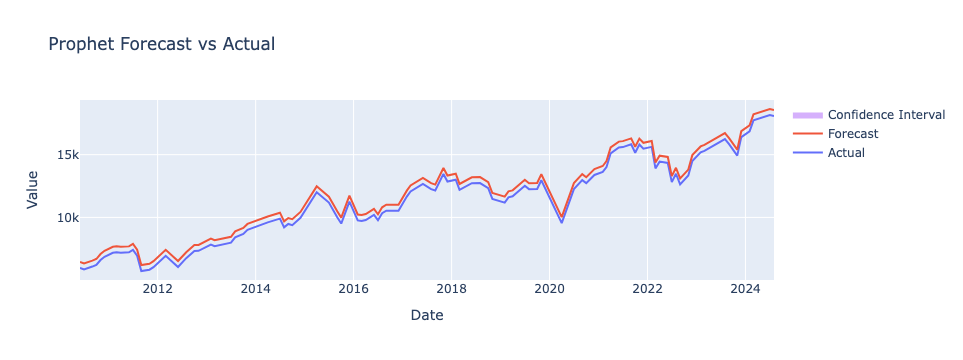

In [218]:
import pandas as pd
import pickle
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import plotly.graph_objects as go

# Load the trained model and data
df = pd.read_pickle('dax_data_month.pkl')
with open('prophet_model_month.pkl', 'rb') as f:
    model = pickle.load(f)

# Ensure all regressors are present in the future dataframe
regressors = ['open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator', 'REXPDE~TUSD', 'CPIDE~TUSD']
future = df[['ds'] + regressors].copy()

# Make predictions on the existing data (no future dates, just evaluation)
forecast = model.predict(future)

# Extract the true values and the predicted values
y_true = df['y'].values
y_pred = forecast['yhat'].values

# Calculate evaluation metrics
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)

# Print the results
print(f"\nModel Evaluation Results:")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")

# Plot the evaluation results with Plotly
fig = go.Figure()

# Plot the actual historical data
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Actual'))

# Plot the forecasted line
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))

# Plot the confidence interval
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))

# Update the layout
fig.update_layout(title='Prophet Forecast vs Actual',
                  xaxis_title='Date',
                  yaxis_title='Value',
                  hovermode='x unified')

# Show the plot
fig.show()


In [219]:
import pandas as pd
import pickle
from datetime import datetime
import plotly.graph_objects as go

# Load the trained model and data
df = pd.read_pickle('dax_data_month.pkl')
with open('prophet_model_month.pkl', 'rb') as f:
    model = pickle.load(f)


In [220]:
# Make a prediction for the next first day of the month
future_dates = pd.date_range(start=datetime.now().date(), periods=1, freq='MS')  # MS = Month Start
future_df = pd.DataFrame({'ds': future_dates})

# Include all regressors, set them to a default value or use last known values
for regressor in ['open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent', 'KalmanEstimate', 'LorentzianIndicator', 'REXPDE~TUSD', 'CPIDE~TUSD']:
    if regressor in df.columns:
        future_df[regressor] = df[regressor].iloc[-1]  # Use last known value as a simple approach

# Make the prediction
forecast = model.predict(future_df)

# Display the prediction
print("\nPrediction for the next first day of the month:")
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])



Prediction for the next first day of the month:
          ds          yhat   yhat_lower    yhat_upper
0 2024-09-01  18556.932494  18556.93246  18556.932527


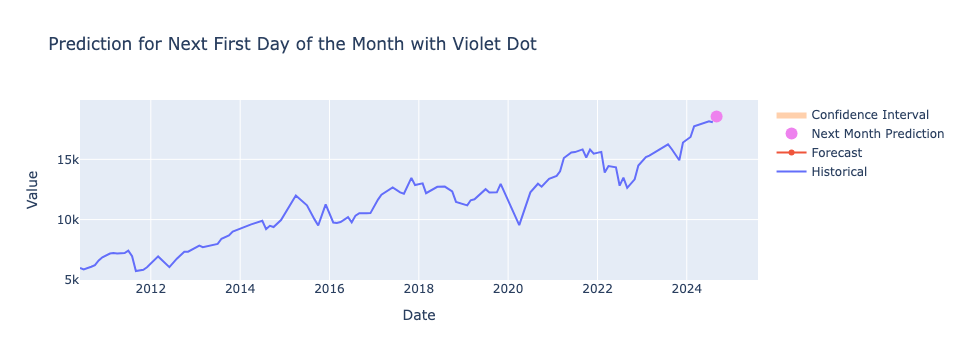

In [221]:
# Plot the historical data and forecast
fig = go.Figure()

# Plot the actual historical data
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Historical'))

# Plot the forecasted line
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines+markers', name='Forecast'))

# Add a violet dot for the next month's prediction
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='markers', name='Next Month Prediction', marker=dict(color='violet', size=12, symbol='circle')))

# Plot the confidence interval
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', fill='tonexty', line=dict(width=0), name='Confidence Interval'))

# Update the layout
fig.update_layout(title='Prediction for Next First Day of the Month with Violet Dot',
                  xaxis_title='Date',
                  yaxis_title='Value',
                  hovermode='x unified')

# Show the plot
fig.show()


# Time-series AutoML with H2O (alternative to Prophet)

## Day range 

In [222]:
# Assuming your dataframe is named combined_df
df = c_df.copy()
df['date'] = pd.to_datetime(df['index'])
# Set 'date' as the index
df.set_index('date', inplace=True)

# Remove the original 'index' column
df = df.drop('index', axis=1)

df.tail(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,close,volume,vwap,adj_close,unadjusted_volume,change,change_percent,KalmanEstimate,LorentzianIndicator
date,,,,,,,,,,,,,,
2024-08-13,441754.0,130.25,17799.66016,17817.07031,17669.64063,17812.05078,0.0,17774.61,17812.05078,0.0,12.39062,0.000696,17971.884663,5.629366
2024-08-14,441754.0,130.25,17882.17969,17921.99023,17827.08008,17885.59961,0.0,17879.21,17885.59961,0.0,3.41992,0.000191,17963.676804,5.581875
2024-08-15,441754.0,130.25,17977.81055,18198.08984,17909.74023,18183.24023,0.0,18067.22,18183.24023,0.0,205.42968,0.011400,17984.562758,5.608979
2024-08-16,441754.0,130.25,18236.01953,18344.22070,18226.59961,18322.40039,63794900.0,18282.31,18322.40039,63794900.0,86.38086,0.004737,18016.699536,5.588865
2024-08-19,441754.0,130.25,18312.50977,18454.93945,18284.85938,18421.68945,43769700.0,18368.50,18421.68945,43769700.0,109.17968,0.005962,18055.224170,5.594636
2024-08-20,441754.0,130.25,18473.23047,18495.27930,18349.98047,18357.51953,42912000.0,18419.00,18357.51953,42912000.0,-115.71094,-0.006264,18083.979993,5.592532
2024-08-21,441754.0,130.25,18358.78906,18476.63086,18352.18945,18448.94922,36068100.0,18409.14,18448.94922,36068100.0,90.16016,0.004911,18118.697662,5.505103
2024-08-22,441754.0,130.25,18459.27930,18551.39063,18458.60938,18493.39063,40950900.0,18490.67,18493.39063,40950900.0,34.11133,0.001848,18154.340301,5.395760
2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,18633.09961,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083,18199.882243,5.234629


In [229]:
import h2o
from h2o.automl import H2OAutoML
import pandas as pd
import numpy as np

# Initialize H2O
h2o.init()

# Assuming 'df' is your original DataFrame
# Make sure it's sorted by date
df = df.sort_index()

# Feature Engineering (with warnings removed)
for col in ['close', 'REXPDE~TUSD', 'volume']:
    df.loc[:, f'{col}_lag_1'] = df[col].shift(1)
    df.loc[:, f'{col}_lag_7'] = df[col].shift(7)
    df.loc[:, f'{col}_return_1'] = df[col].pct_change(1)
    df.loc[:, f'{col}_return_7'] = df[col].pct_change(7)

# Special handling for CPIDE
df.loc[:, 'CPIDE_lag_1'] = df['CPIDE~TUSD'].shift(1)
df.loc[:, 'CPIDE_lag_7'] = df['CPIDE~TUSD'].shift(7)
df.loc[:, 'CPIDE_return_1'] = df['CPIDE~TUSD'].pct_change(1)
df.loc[:, 'CPIDE_return_7'] = df['CPIDE~TUSD'].pct_change(7)

# Remove rows with NaN values
df = df.dropna()

# Select features
features = ['REXPDE~TUSD', 'CPIDE~TUSD', 'volume', 'vwap', 'LorentzianIndicator',
            'REXPDE~TUSD_lag_1', 'REXPDE~TUSD_lag_7', 'REXPDE~TUSD_return_1', 'REXPDE~TUSD_return_7',
            'volume_lag_1', 'volume_lag_7', 'volume_return_1', 'volume_return_7',
            'CPIDE_lag_1', 'CPIDE_lag_7', 'CPIDE_return_1', 'CPIDE_return_7']
target = 'close'

print("Features used:", features)
print("\nDataFrame shape:", df.shape)
print("\nDataFrame column types:")
print(df.dtypes)

# Convert to H2OFrame
h2o_df = h2o.H2OFrame(df.reset_index())

print("\nH2OFrame column types:")
print(h2o_df.types)

# Split the data into train and validation sets
train, valid = h2o_df.split_frame(ratios=[0.8], seed=1234)

# Run AutoML with adjusted parameters
aml = H2OAutoML(max_runtime_secs=3600,  # 1 hour
                seed=1234,
                sort_metric='RMSE',
                stopping_rounds=10,
                stopping_tolerance=0.001,
                stopping_metric='RMSE',
                max_models=20,
                keep_cross_validation_predictions=True,
                keep_cross_validation_models=True,
                verbosity='info',
                nfolds=5)

# Train the model
aml.train(x=features, y=target, training_frame=train, validation_frame=valid)

# Get the best model
best_model = aml.leader
print("\nBest model:", best_model)

# Save the model
model_path = h2o.save_model(model=best_model, path="./", force=True)
print(f"\nModel saved to: {model_path}")

# Save the DataFrame to a pickle file for later use
df.to_pickle('dax_data.pkl')
with open('model_path.txt', 'w') as f:
    f.write(model_path)
print("DataFrame and model path saved.")

# Optionally, you can print feature importances
if hasattr(best_model, 'varimp'):
    print("\nFeature Importances:")
    print(best_model.varimp())

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 30 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.4
H2O_cluster_version_age:,1 month and 16 days
H2O_cluster_name:,H2O_from_python_marius_f9963f
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2.351 Gb
H2O_cluster_total_cores:,6
H2O_cluster_allowed_cores:,6
H2O_cluster_status:,"locked, healthy"


Features used: ['REXPDE~TUSD', 'CPIDE~TUSD', 'volume', 'vwap', 'LorentzianIndicator', 'REXPDE~TUSD_lag_1', 'REXPDE~TUSD_lag_7', 'REXPDE~TUSD_return_1', 'REXPDE~TUSD_return_7', 'volume_lag_1', 'volume_lag_7', 'volume_return_1', 'volume_return_7', 'CPIDE_lag_1', 'CPIDE_lag_7', 'CPIDE_return_1', 'CPIDE_return_7']

DataFrame shape: (3585, 30)

DataFrame column types:
REXPDE~TUSD             float64
CPIDE~TUSD              float64
open                    float64
high                    float64
low                     float64
close                   float64
volume                  float64
vwap                    float64
adj_close               float64
unadjusted_volume       float64
change                  float64
change_percent          float64
KalmanEstimate          float64
LorentzianIndicator     float64
close_lag_1             float64
close_lag_7             float64
close_return_1          float64
close_return_7          float64
REXPDE~TUSD_lag_1       float64
REXPDE~TUSD_lag_7       fl

In [237]:
import h2o
import pandas as pd
import pickle
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Initialize H2O
h2o.init()

# Load the trained model and data
df = pd.read_pickle('dax_data.pkl')
model_path = open('model_path.txt', 'r').read().strip()
best_model = h2o.load_model(model_path)

# Convert the DataFrame to an H2OFrame
h2o_df = h2o.H2OFrame(df)

# Split the data back into train, validation, and test sets
train, valid, test = h2o_df.split_frame(ratios=[0.7, 0.15], seed=1234)


Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 52 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.4
H2O_cluster_version_age:,1 month and 16 days
H2O_cluster_name:,H2O_from_python_marius_f9963f
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.925 Gb
H2O_cluster_total_cores:,6
H2O_cluster_allowed_cores:,6
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [238]:
# Generate predictions on the validation set
predictions = best_model.predict(valid)

# Convert H2OFrame to Pandas DataFrame
y_true = valid['close'].as_data_frame().values.flatten()  # Actual values
y_pred = predictions.as_data_frame().values.flatten()      # Predicted values

# Calculate evaluation metrics
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)

# Print the evaluation metrics
print(f"\nModel Evaluation Results on Validation Set:")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")


stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%

Model Evaluation Results on Validation Set:
Root Mean Squared Error (RMSE): 70.87788472386278
Mean Absolute Error (MAE): 39.49734823980442


/home/marius/miniconda3/envs/openbb/lib/python3.11/site-packages/h2o/frame.py:1981: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)


/home/marius/miniconda3/envs/openbb/lib/python3.11/site-packages/h2o/frame.py:1981: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)




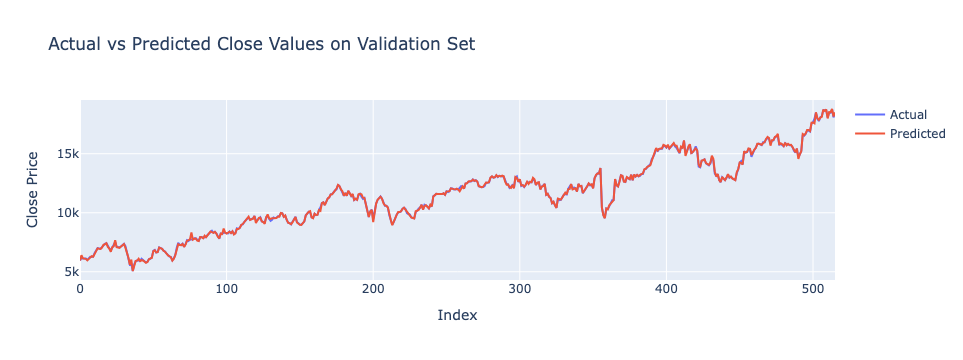

In [239]:
import plotly.graph_objects as go

# Create a plot to visualize the predictions vs actual values
fig = go.Figure()

# Plot the actual values
fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true, mode='lines', name='Actual'))

# Plot the predicted values
fig.add_trace(go.Scatter(x=np.arange(len(y_pred)), y=y_pred, mode='lines', name='Predicted'))

# Update layout
fig.update_layout(title='Actual vs Predicted Close Values on Validation Set',
                  xaxis_title='Index',
                  yaxis_title='Close Price',
                  hovermode='x unified')

# Show the plot
fig.show()


In [240]:
import h2o
import pandas as pd

# Load the DataFrame and model
df = pd.read_pickle('dax_data.pkl')

# Convert the DataFrame to an H2OFrame
h2o_df = h2o.H2OFrame(df)

# Print data types to confirm
print("\nH2OFrame column types:")
print(h2o_df.types)


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%

H2OFrame column types:
{'REXPDE~TUSD': 'int', 'CPIDE~TUSD': 'real', 'open': 'real', 'high': 'real', 'low': 'real', 'close': 'real', 'volume': 'int', 'vwap': 'real', 'adj_close': 'real', 'unadjusted_volume': 'int', 'change': 'real', 'change_percent': 'real', 'KalmanEstimate': 'real', 'LorentzianIndicator': 'real', 'close_lag_1': 'real', 'close_lag_7': 'real', 'close_return_1': 'real', 'close_return_7': 'real', 'REXPDE~TUSD_lag_1': 'int', 'REXPDE~TUSD_lag_7': 'int', 'REXPDE~TUSD_return_1': 'int', 'REXPDE~TUSD_return_7': 'int', 'volume_lag_1': 'int', 'volume_lag_7': 'int', 'volume_return_1': 'real', 'volume_return_7': 'real', 'CPIDE_lag_1': 'real', 'CPIDE_lag_7': 'real', 'CPIDE_return_1': 'int', 'CPIDE_return_7': 'int'}


In [241]:
import h2o
import pandas as pd
from datetime import datetime, timedelta

# Prepare the data for the next day prediction
last_row = df.iloc[-1].copy()

next_day = last_row.name + timedelta(days=1)

# Create a new Series for the next day, using the next day as the index
next_day_series = last_row.copy()
next_day_series.name = next_day

# Convert to DataFrame
next_day_df = pd.DataFrame([next_day_series])

# Ensure 'volume_return_7' and all similar columns are set as float
next_day_df['volume_return_7'] = next_day_df['volume_return_7'].astype('float')

# Define the types dictionary
types_dict = {
    'open': 'real',
    'high': 'real',
    'low': 'real',
    'close': 'real',
    'volume': 'int',
    'vwap': 'real',
    'adj_close': 'real',
    'unadjusted_volume': 'int',
    'change': 'real',
    'change_percent': 'real',
    'KalmanEstimate': 'real',
    'LorentzianIndicator': 'real',
    'REXPDE~TUSD': 'int',
    'CPIDE': 'real',
    'close_lag_1': 'real',
    'close_lag_7': 'real',
    'close_lag_30': 'real',
    'close_return_1': 'real',
    'close_return_7': 'real',
    'close_return_30': 'real',
    'REXPDE~TUSD_lag_1': 'int',
    'REXPDE~TUSD_lag_7': 'int',
    'REXPDE~TUSD_lag_30': 'int',
    'REXPDE~TUSD_return_1': 'real',
    'REXPDE~TUSD_return_7': 'real',
    'REXPDE~TUSD_return_30': 'real',
    'LorentzianIndicator_lag_1': 'real',
    'LorentzianIndicator_lag_7': 'real',
    'LorentzianIndicator_lag_30': 'real',
    'LorentzianIndicator_return_1': 'real',
    'LorentzianIndicator_return_7': 'real',
    'LorentzianIndicator_return_30': 'real',
    'volume_lag_1': 'int',
    'volume_lag_7': 'int',
    'volume_lag_30': 'int',
    'volume_return_1': 'real',
    'volume_return_7': 'real',
    'volume_return_30': 'real',
    'CPIDE_lag_1': 'real',
    'CPIDE_lag_7': 'real',
    'CPIDE_lag_30': 'real',
    'CPIDE_return_1': 'real',
    'CPIDE_return_7': 'real',
    'CPIDE_return_30': 'real',
}

# Filter the types_dict to only include keys that are in next_day_df columns
filtered_types_dict = {k: v for k, v in types_dict.items() if k in next_day_df.columns}

# Convert the DataFrame to an H2OFrame with the filtered types_dict
next_day_h2o = h2o.H2OFrame(next_day_df, column_types=filtered_types_dict)

print("Next day's H2OFrame:")
print(next_day_h2o)


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Next day's H2OFrame:
  REXPDE~TUSD    CPIDE~TUSD     open     high      low    close       volume     vwap    adj_close    unadjusted_volume    change    change_percent    KalmanEstimate    LorentzianIndicator    close_lag_1    close_lag_7    close_return_1    close_return_7    REXPDE~TUSD_lag_1    REXPDE~TUSD_lag_7    REXPDE~TUSD_return_1    REXPDE~TUSD_return_7    volume_lag_1    volume_lag_7    volume_return_1    volume_return_7    CPIDE_lag_1    CPIDE_lag_7    CPIDE_return_1    CPIDE_return_7
       441754        130.25  18538.9  18670.4  18519.3  18633.1  4.11225e+07  18590.4      18633.1          4.11225e+07   94.2305         0.0050829           18199.9                5.23463        18493.4        17726.5        0.00755454         0.0511455               441754               441754                       0                       0     4.09509e+07     3.87086e+07         0.00419038        

In [242]:
# Predict the 'close' value for the next day
try:
    prediction = best_model.predict(next_day_h2o)
    predicted_close = prediction.as_data_frame().iloc[0, 0]
    print(f"Prediction for {next_day.date()}: {predicted_close}")
except Exception as e:
    print(f"An error occurred during prediction: {str(e)}")


stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Prediction for 2024-08-24: 18676.59221790417


/home/marius/miniconda3/envs/openbb/lib/python3.11/site-packages/h2o/frame.py:1981: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)




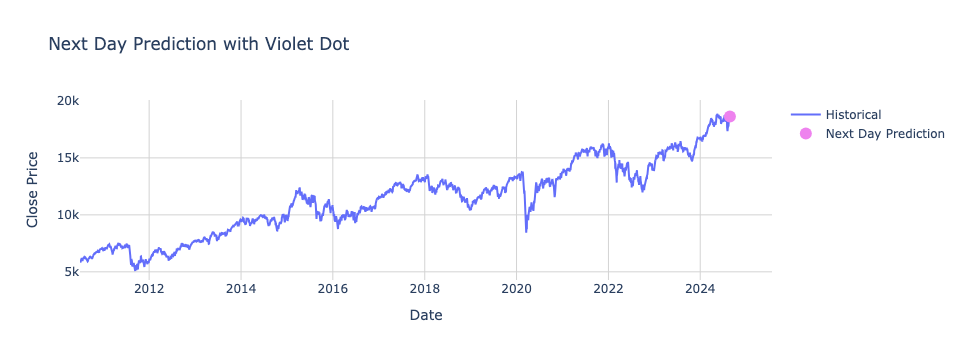

In [243]:
import plotly.graph_objects as go

# Historical data
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['close'], mode='lines', name='Historical'))

# Plot the prediction with a violet dot
fig.add_trace(go.Scatter(x=[next_day_df.index[0]], y=[next_day_df['close'].iloc[0]], mode='markers', name='Next Day Prediction', marker=dict(color='violet', size=12, symbol='circle')))

# Update layout for better style
fig.update_layout(
    title='Next Day Prediction with Violet Dot',
    xaxis_title='Date',
    yaxis_title='Close Price',
    hovermode='x unified',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showgrid=True, gridcolor='LightGray'),
    yaxis=dict(showgrid=True, gridcolor='LightGray')
)

# Show the plot
fig.show()

# Kalman estimate (high, low, close)

Useful for stop-loss and take-profit estimation.

In [128]:
df = combined_df.iloc[-365:]
print(df.dtypes)

index                 object
REXPDE~TUSD          float64
CPIDE~TUSD           float64
open                 float64
high                 float64
low                  float64
close                float64
volume               float64
vwap                 float64
adj_close            float64
unadjusted_volume    float64
change               float64
change_percent       float64
dtype: object


In [129]:
print(df.head(1))

            index  REXPDE~TUSD  CPIDE~TUSD      open          high  \
18133  2023-03-23     441754.0      130.25  15178.25  15244.320313   

                low         close      volume      vwap     adj_close  \
18133  15078.719727  15210.389648  82739800.0  15177.81  15210.389648   

       unadjusted_volume    change  change_percent  
18133         82739800.0  32.13965        0.002118  


In [130]:
print(df.index.dtype)

int64


In [131]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['close'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18237.40405528656


In [132]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['high'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['high'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18304.2989056854


In [133]:
import numpy as np
from pykalman import KalmanFilter

# Assuming df is your DataFrame with a 'close' column

# Initialize Kalman Filter
kf = KalmanFilter(
    initial_state_mean=df['close'].iloc[0],
    initial_state_covariance=1,
    transition_matrices=[1],
    observation_matrices=[1],
    observation_covariance=1,
    transition_covariance=0.01
)

# Filter the data
filtered_state_means, filtered_state_covariances = kf.filter(df['close'])

# Get the last filtered state
last_state_mean = filtered_state_means[-1]
last_state_covariance = filtered_state_covariances[-1]

# Predict the next state
next_state_mean, next_state_covariance = kf.filter_update(
    filtered_state_mean=last_state_mean,
    filtered_state_covariance=last_state_covariance
)

print(f"Estimate for the next value: {next_state_mean[0]}")

Estimate for the next value: 18237.40405528656


# Buy / sell signals for the Dax (GDAXi)

In [134]:
import pandas as pd
import numpy as np
import talib as ta

In [135]:
df = combined_df.iloc[-365:].copy()
print(df.dtypes)


index                 object
REXPDE~TUSD          float64
CPIDE~TUSD           float64
open                 float64
high                 float64
low                  float64
close                float64
volume               float64
vwap                 float64
adj_close            float64
unadjusted_volume    float64
change               float64
change_percent       float64
dtype: object


In [136]:
def ma(ma_type, src, length, volume=None):
    if ma_type == 'SMA':
        return ta.SMA(src, timeperiod=length)
    elif ma_type == 'EMA':
        return ta.EMA(src, timeperiod=length)
    elif ma_type == 'DEMA':
        return ta.DEMA(src, timeperiod=length)
    elif ma_type == 'TEMA':
        return ta.TEMA(src, timeperiod=length)
    elif ma_type == 'WMA':
        return ta.WMA(src, timeperiod=length)
    elif ma_type == 'VWMA':
        if volume is None:
            raise ValueError("Volume data is required for VWMA")
        return ta.SMA(src * volume, timeperiod=length) / ta.SMA(volume, timeperiod=length)
    elif ma_type == 'SMMA':
        return ta.SMA(src, timeperiod=length)
    elif ma_type == 'HMA':
        return ta.WMA(2 * ta.WMA(src, timeperiod=length // 2) - ta.WMA(src, timeperiod=length), timeperiod=int(np.sqrt(length)))
    elif ma_type == 'LSMA':
        return ta.LINEARREG(src, timeperiod=length)
    elif ma_type == 'PEMA':
        ema1 = ta.EMA(src, timeperiod=length)
        ema2 = ta.EMA(ema1, timeperiod=length)
        ema3 = ta.EMA(ema2, timeperiod=length)
        ema4 = ta.EMA(ema3, timeperiod=length)
        ema5 = ta.EMA(ema4, timeperiod=length)
        ema6 = ta.EMA(ema5, timeperiod=length)
        ema7 = ta.EMA(ema6, timeperiod=length)
        ema8 = ta.EMA(ema7, timeperiod=length)
        return 8 * ema1 - 28 * ema2 + 56 * ema3 - 70 * ema4 + 56 * ema5 - 28 * ema6 + 8 * ema7 - ema8
    else:
        raise ValueError(f"Unknown MA Type: {ma_type}")


In [137]:
def kalman_filter(df, sharpness, k_period):
    df.loc[:, 'kfilt'] = 0.0
    df.loc[:, 'velocity'] = 0.0
    for i in range(1, len(df)):
        distance = df['close'].iloc[i] - df['kfilt'].iloc[i - 1]
        error = df['kfilt'].iloc[i - 1] + distance * np.sqrt(sharpness * k_period / 100)
        velocity = df['velocity'].iloc[i - 1] + distance * k_period / 100
        df.loc[df.index[i], 'kfilt'] = error + velocity
        df.loc[df.index[i], 'velocity'] = velocity
    return df['kfilt']


In [138]:
def calculate_roc(df, length):
    return ta.ROC(df['kfilt'], timeperiod=length)


In [139]:
def calculate_stochastic(df, periodK, smoothK, periodD):
    k, d = ta.STOCH(df['high'], df['low'], df['close'],
                    fastk_period=periodK,
                    slowk_period=smoothK, 
                    slowk_matype=0,
                    slowd_period=periodD,
                    slowd_matype=0)
    return k, d


In [140]:
def calculate_blend(df, ma_type, smoothlen):
    roc = calculate_roc(df, length=9)  # Assuming length=9
    _, d = calculate_stochastic(df, periodK=14, smoothK=1, periodD=3)  # Default values
    blend = (roc + d) / 2
    blend = ma(ma_type, blend, smoothlen)
    blend = blend.dropna()  # Drop NaN values that could arise from insufficient data
    return blend


In [141]:
def generate_signals(df, blend):
    df.loc[:, 'buy_signal'] = np.where((blend > blend.shift(1)) & (blend.shift(1) <= blend.shift(2)), 1, 0)
    df.loc[:, 'sell_signal'] = np.where((blend < blend.shift(1)) & (blend.shift(1) >= blend.shift(2)), 1, 0)
    return df


In [142]:
def analyze(df, ma_type='TEMA', smoothlen=12, sharpness=25.0, k_period=1.0):
    df['kfilt'] = kalman_filter(df, sharpness, k_period)
    blend = calculate_blend(df, ma_type, smoothlen)
    
    # Reindex blend to match the original DataFrame index, filling NaNs if necessary
    blend = blend.reindex(df.index)
    
    # Fill NaNs with forward fill (or choose another method like backward fill or fill with a specific value)
    blend = blend.ffill()  # forward fill to replace NaNs
    
    df['blend'] = blend
    
    # Generate signals
    df = generate_signals(df, df['blend'])
    
    return df[['buy_signal', 'sell_signal']]  # Return only the buy and sell signals

In [143]:
# Analyze and print only the buy and sell signals
signal_df = analyze(df)
print(signal_df)


       buy_signal  sell_signal
18133           0            0
18134           0            0
18135           0            0
18136           0            0
18137           0            0
...           ...          ...
18493           0            0
18494           0            0
18495           0            0
18496           0            0
18497           0            0

[365 rows x 2 columns]


In [144]:
import plotly.graph_objs as go
import plotly.express as px

# Example: Assuming 'df' is the DataFrame after analysis and contains the 'buy_signal' and 'sell_signal' columns
# and 'close' column to plot the price



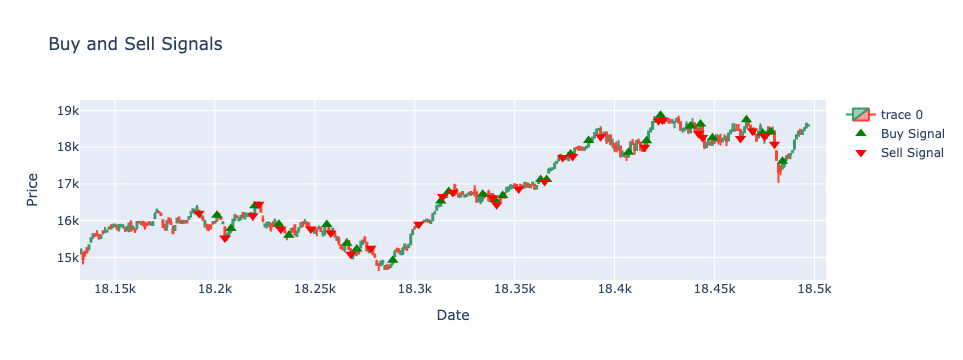

In [145]:
def plot_signals(df):
    # Create a candlestick chart
    fig = go.Figure(data=[go.Candlestick(x=df.index,
                                         open=df['open'],
                                         high=df['high'],
                                         low=df['low'],
                                         close=df['close'])])

    # Add Buy signals as green up arrows
    buy_signals = df[df['buy_signal'] == 1]
    fig.add_trace(go.Scatter(x=buy_signals.index,
                             y=buy_signals['close'],
                             mode='markers',
                             marker=dict(symbol='triangle-up', color='green', size=10),
                             name='Buy Signal'))

    # Add Sell signals as red down arrows
    sell_signals = df[df['sell_signal'] == 1]
    fig.add_trace(go.Scatter(x=sell_signals.index,
                             y=sell_signals['close'],
                             mode='markers',
                             marker=dict(symbol='triangle-down', color='red', size=10),
                             name='Sell Signal'))

    # Update layout for better visuals
    fig.update_layout(title='Buy and Sell Signals',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      xaxis_rangeslider_visible=False)

    # Show the plot
    fig.show()

# Assuming signal_df contains the 'buy_signal' and 'sell_signal' columns along with price data
plot_signals(df)


In [146]:
def get_signal_list(df):
    # Create an empty list to store the signals
    signals = []
    
    # Iterate through the DataFrame and check for buy and sell signals
    for index, row in df.iterrows():
        if row['buy_signal'] == 1:
            signals.append({'Date': index, 'Signal': 'Buy', 'Price': row['close']})
        elif row['sell_signal'] == 1:
            signals.append({'Date': index, 'Signal': 'Sell', 'Price': row['close']})
    
    return signals


In [147]:
# Assuming df contains the 'buy_signal' and 'sell_signal' columns
signal_list = get_signal_list(df)

# Display the signal list
for signal in signal_list:
    print(f"Date: {signal['Date']}, Signal: {signal['Signal']}, Price: {signal['Price']}")


Date: 18192, Signal: Sell, Price: 16201.2
Date: 18201, Signal: Buy, Price: 16147.9
Date: 18205, Signal: Sell, Price: 15528.54
Date: 18208, Signal: Buy, Price: 15790.34
Date: 18219, Signal: Sell, Price: 16131.46
Date: 18220, Signal: Buy, Price: 16406.03
Date: 18222, Signal: Sell, Price: 16446.83
Date: 18232, Signal: Buy, Price: 15904.25
Date: 18233, Signal: Sell, Price: 15767.28
Date: 18237, Signal: Buy, Price: 15603.28
Date: 18248, Signal: Sell, Price: 15771.71
Date: 18256, Signal: Buy, Price: 15893.53
Date: 18258, Signal: Sell, Price: 15664.48
Date: 18266, Signal: Buy, Price: 15386.58
Date: 18268, Signal: Sell, Price: 15085.21
Date: 18271, Signal: Buy, Price: 15229.77
Date: 18278, Signal: Sell, Price: 15251.69043
Date: 18289, Signal: Buy, Price: 14923.26953
Date: 18302, Signal: Sell, Price: 15901.33008
Date: 18313, Signal: Buy, Price: 16533.10938
Date: 18314, Signal: Sell, Price: 16656.43945
Date: 18317, Signal: Buy, Price: 16794.42969
Date: 18319, Signal: Sell, Price: 16766.05078
Dat

## Backtest

In [ ]:
initial_depot = 10000  # Initial depot in Euros
depot = initial_depot  # Current depot value
position_size_percentage = 0.03   # 3% of the depot for each trade
stop_loss_points = 100  # Stop loss of 100 points
dax_data = df['close']  # Assuming 'close' is the DAX price column

# Generate the signal list as in the previous steps
signal_list = get_signal_list(df)


In [ ]:
from datetime import datetime, timedelta

# Assuming signal['Date'] is a string, convert it to datetime
# If signal['Date'] is already a datetime object, you can skip this conversion
for signal in signal_list:
    signal_date = pd.to_datetime(signal['Date'])  # Ensure signal_date is a datetime object
    signal_type = signal['Signal']
    signal_price = signal['Price']
    
    if signal_type == 'Buy':
        if current_position is None:  # Enter a new long position
            position_size = depot * position_size_percentage
            entry_price = signal_price
            entry_date = signal_date
            current_position = 'long'
            results.append({
                'Date': signal_date,
                'Action': 'Buy',
                'Entry Price': entry_price,
                'Position Size': position_size,
                'Depot': depot
            })
    
    elif signal_type == 'Sell':
        if current_position == 'long':  # Exit the long position
            profit = (signal_price - entry_price) * (position_size / entry_price)
            depot += profit
            results.append({
                'Date': signal_date,
                'Action': 'Sell',
                'Exit Price': signal_price,
                'Profit': profit,
                'Depot': depot
            })
            current_position = None
    
    # Implement stop loss logic
    if current_position == 'long' and signal_price <= entry_price - stop_loss_points:
        # Sell the position if stop loss is hit
        loss = (entry_price - (entry_price - stop_loss_points)) * (position_size / entry_price)
        depot -= loss
        results.append({
            'Date': signal_date,
            'Action': 'Stop Loss Triggered',
            'Exit Price': entry_price - stop_loss_points,
            'Loss': loss,
            'Depot': depot
        })
        current_position = None
    
    # Automatically close the position after 2 days
    if current_position == 'long' and (signal_date - entry_date).days >= 2:
        profit = (signal_price - entry_price) * (position_size / entry_price)
        depot += profit
        results.append({
            'Date': signal_date,
            'Action': 'Auto Close After 2 Days',
            'Exit Price': signal_price,
            'Profit': profit,
            'Depot': depot
        })
        current_position = None


In [ ]:
# Display the results
for trade in results:
    profit_loss = trade.get('Profit', trade.get('Loss', 'N/A'))
    # Only format profit_loss if it's a number
    if isinstance(profit_loss, (int, float)):
        profit_loss = f"{profit_loss:.2f}"
    
    print(f"Date: {trade['Date']}, Action: {trade['Action']}, "
          f"Entry Price: {trade.get('Entry Price', 'N/A')}, "
          f"Exit Price: {trade.get('Exit Price', 'N/A')}, "
          f"Profit/Loss: {profit_loss}, "
          f"Depot: {trade['Depot']:.2f}")

# Print the final depot value
print(f"\nFinal Depot Value: {depot:.2f} Euros")


# Prophet training w train test split

This may indicate problems. The actual way isn't god.

In [280]:
c_df = combined_df.copy()
c_df = c_df.tail(10 * 365)
nan_counts = c_df.isna().sum()
print(nan_counts)

# Assuming your dataframe is named combined_df
df = c_df.copy()
df['date'] = pd.to_datetime(df['index'])
# Set 'date' as the index
df.set_index('date', inplace=True)

# Remove the original 'index' column
df = df.drop('index', axis=1)

# Remove rows with NaN values
df = df.dropna()

df['ds'] = df.index
df['y'] = df["close"]
df = df.drop(columns=['close'])

index                0
REXPDE~TUSD          0
CPIDE~TUSD           0
open                 0
high                 0
low                  0
close                0
volume               0
vwap                 0
adj_close            0
unadjusted_volume    0
change               0
change_percent       0
dtype: int64


In [252]:
df.tail(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,volume,vwap,adj_close,unadjusted_volume,change,change_percent,ds,y
date,,,,,,,,,,,,,
2024-08-13,441754.0,130.25,17799.66016,17817.07031,17669.64063,0.0,17774.61,17812.05078,0.0,12.39062,0.000696,2024-08-13,17812.05078
2024-08-14,441754.0,130.25,17882.17969,17921.99023,17827.08008,0.0,17879.21,17885.59961,0.0,3.41992,0.000191,2024-08-14,17885.59961
2024-08-15,441754.0,130.25,17977.81055,18198.08984,17909.74023,0.0,18067.22,18183.24023,0.0,205.42968,0.011400,2024-08-15,18183.24023
2024-08-16,441754.0,130.25,18236.01953,18344.22070,18226.59961,63794900.0,18282.31,18322.40039,63794900.0,86.38086,0.004737,2024-08-16,18322.40039
2024-08-19,441754.0,130.25,18312.50977,18454.93945,18284.85938,43769700.0,18368.50,18421.68945,43769700.0,109.17968,0.005962,2024-08-19,18421.68945
2024-08-20,441754.0,130.25,18473.23047,18495.27930,18349.98047,42912000.0,18419.00,18357.51953,42912000.0,-115.71094,-0.006264,2024-08-20,18357.51953
2024-08-21,441754.0,130.25,18358.78906,18476.63086,18352.18945,36068100.0,18409.14,18448.94922,36068100.0,90.16016,0.004911,2024-08-21,18448.94922
2024-08-22,441754.0,130.25,18459.27930,18551.39063,18458.60938,40950900.0,18490.67,18493.39063,40950900.0,34.11133,0.001848,2024-08-22,18493.39063
2024-08-23,441754.0,130.25,18538.86914,18670.44922,18519.28906,41122500.0,18590.43,18633.09961,41122500.0,94.23047,0.005083,2024-08-23,18633.09961


In [253]:
df.head(10)

,REXPDE~TUSD,CPIDE~TUSD,open,high,low,volume,vwap,adj_close,unadjusted_volume,change,change_percent,ds,y
date,,,,,,,,,,,,,
2010-04-14,441754.0,130.25,6269.479981,6305.149902,6249.919922,119609300.0,6277.82324,6278.399902,119609300.0,8.91992,0.00142,2010-04-14,6278.399902
2010-04-15,441754.0,130.25,6286.629883,6310.759766,6249.740234,108953700.0,6283.98340,6291.450195,108953700.0,4.82031,0.00077,2010-04-15,6291.450195
2010-04-16,441754.0,130.25,6264.649902,6305.399902,6162.839844,195883500.0,6216.37988,6180.899902,195883500.0,-83.75000,-0.01337,2010-04-16,6180.899902
2010-04-19,441754.0,130.25,6158.600098,6190.859863,6140.379883,133583500.0,6164.55990,6162.439941,133583500.0,3.83984,0.00062,2010-04-19,6162.439941
2010-04-20,441754.0,130.25,6193.500000,6267.540039,6172.569824,133489200.0,6234.77995,6264.229981,133489200.0,70.72998,0.01142,2010-04-20,6264.229981
2010-04-21,441754.0,130.25,6280.540039,6281.379883,6229.180176,149364800.0,6246.97998,6230.379883,149364800.0,-50.16016,-0.00799,2010-04-21,6230.379883
2010-04-22,441754.0,130.25,6229.229981,6286.359863,6141.069824,174052000.0,6198.71663,6168.720215,174052000.0,-60.50977,-0.00971,2010-04-22,6168.720215
2010-04-23,441754.0,130.25,6192.620117,6287.540039,6170.390137,124506000.0,6239.15332,6259.529785,124506000.0,66.90967,0.01080,2010-04-23,6259.529785
2010-04-26,441754.0,130.25,6317.129883,6341.520019,6299.580078,115432400.0,6324.40007,6332.100098,115432400.0,14.97021,0.00237,2010-04-26,6332.100098


In [254]:
import pandas as pd


print(f"Original data length: {len(df)} rows")

Original data length: 3650 rows


In [255]:
# Apply forward filling to propagate the last known value forward
df = df.ffill()

In [256]:
df.head(5)
len(df)

3650

In [257]:
# Determine the split index
train_size = int(0.7 * len(df))
test_size = int(0.2 * len(df))
val_size = len(df) - train_size - test_size

# Split the data
train_df = df.iloc[:train_size]
test_df = df.iloc[train_size:train_size + test_size]
val_df = df.iloc[train_size + test_size:]

print(f"Train set: {len(train_df)} rows")
print(f"Test set: {len(test_df)} rows")
print(f"Validation set: {len(val_df)} rows")


Train set: 2555 rows
Test set: 730 rows
Validation set: 365 rows


In [260]:
import pickle

# After training the model
model = train_prophet_model(train_df, regressors)

# Save the model to a file
with open('prophet_model_proper.pkl', 'wb') as file:
    pickle.dump(model, file)

print("Model saved as 'prophet_model.pkl'")

12:25:05 - cmdstanpy - INFO - Chain [1] start processing
12:25:06 - cmdstanpy - INFO - Chain [1] done processing
12:25:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
12:25:06 - cmdstanpy - INFO - Chain [1] start processing
12:35:20 - cmdstanpy - INFO - Chain [1] done processing


Model saved as 'prophet_model.pkl'


In [261]:
# Assuming df is your full dataset before splitting
# Determine the validation set size (e.g., 20% of the data)

val_size = int(0.2 * len(df))  # Adjust this percentage as needed

# Create the validation set from the last val_size rows
val_df = df[-val_size:]

# Ensure the validation dataset is correctly formatted
print(val_df.tail())


            REXPDE~TUSD  CPIDE~TUSD         open         high          low  \
date                                                                         
2024-08-20     441754.0      130.25  18473.23047  18495.27930  18349.98047   
2024-08-21     441754.0      130.25  18358.78906  18476.63086  18352.18945   
2024-08-22     441754.0      130.25  18459.27930  18551.39063  18458.60938   
2024-08-23     441754.0      130.25  18538.86914  18670.44922  18519.28906   
2024-08-26     441754.0      130.25  18589.90000  18606.84000  18554.51000   

                volume      vwap    adj_close  unadjusted_volume     change  \
date                                                                          
2024-08-20  42912000.0  18419.00  18357.51953         42912000.0 -115.71094   
2024-08-21  36068100.0  18409.14  18448.94922         36068100.0   90.16016   
2024-08-22  40950900.0  18490.67  18493.39063         40950900.0   34.11133   
2024-08-23  41122500.0  18590.43  18633.09961         4112

In [274]:
# Ensure the 'ds' column is in datetime format (required for Prophet)
val_df.loc[:, 'ds'] = pd.to_datetime(val_df['ds'])

# Check the structure and the last few rows of the validation dataset
print(val_df.tail())


            REXPDE~TUSD  CPIDE~TUSD         open         high          low  \
date                                                                         
2024-08-20     441754.0      130.25  18473.23047  18495.27930  18349.98047   
2024-08-21     441754.0      130.25  18358.78906  18476.63086  18352.18945   
2024-08-22     441754.0      130.25  18459.27930  18551.39063  18458.60938   
2024-08-23     441754.0      130.25  18538.86914  18670.44922  18519.28906   
2024-08-26     441754.0      130.25  18589.90000  18606.84000  18554.51000   

                volume      vwap    adj_close  unadjusted_volume     change  \
date                                                                          
2024-08-20  42912000.0  18419.00  18357.51953         42912000.0 -115.71094   
2024-08-21  36068100.0  18409.14  18448.94922         36068100.0   90.16016   
2024-08-22  40950900.0  18490.67  18493.39063         40950900.0   34.11133   
2024-08-23  41122500.0  18590.43  18633.09961         4112

In [275]:
# List the columns that should be in val_df (add or remove based on your model)
required_columns = ['ds', 'y', 'open', 'high', 'low', 'volume', 'vwap', 'adj_close', 'unadjusted_volume', 'change', 'change_percent','REXPDE~TUSD', 'CPIDE~TUSD']

# Check if all required columns are present in val_df
for col in required_columns:
    if col not in val_df.columns:
        print(f"Missing column in validation data: {col}")


In [276]:
# Forward fill missing values in val_df
val_df = val_df.ffill().bfill()

# Check for any remaining NaNs
print(val_df.isnull().sum())


REXPDE~TUSD          0
CPIDE~TUSD           0
open                 0
high                 0
low                  0
volume               0
vwap                 0
adj_close            0
unadjusted_volume    0
change               0
change_percent       0
ds                   0
y                    0
dtype: int64


In [272]:
small_val_df = val_df.head(10)
small_forecast = model.predict(small_val_df)
print(small_forecast[['ds', 'yhat']].head())

          ds          yhat
0 2021-10-21  15472.223445
1 2021-10-22  15542.644191
2 2021-10-25  15598.894069
3 2021-10-26  15756.722828
4 2021-10-27  15705.472939


In [278]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Create copies of the dataframes to avoid SettingWithCopyWarning
val_df = val_df.copy()
val_forecast = model.predict(val_df)

# Convert 'ds' to datetime if it's not already
val_df.loc[:, 'ds'] = pd.to_datetime(val_df['ds'])
val_forecast.loc[:, 'ds'] = pd.to_datetime(val_forecast['ds'])

# Trim val_forecast to match val_df date range
val_forecast_trimmed = val_forecast[
    (val_forecast['ds'] >= val_df['ds'].min()) &
    (val_forecast['ds'] <= val_df['ds'].max())
].copy()

# Merge the trimmed forecast with the validation data
results = pd.merge(val_df[['ds', 'y']], val_forecast_trimmed[['ds', 'yhat']], on='ds', how='inner')

print("Shape of val_df:", val_df.shape)
print("Shape of val_forecast:", val_forecast.shape)
print("Shape of val_forecast_trimmed:", val_forecast_trimmed.shape)
print("Shape of merged results:", results.shape)
print("\nFirst few rows of merged results:")
print(results.head())
print("\nLast few rows of merged results:")
print(results.tail())
print("\nNaN values in merged results:")
print(results.isna().sum())

Shape of val_df: (730, 13)
Shape of val_forecast: (730, 55)
Shape of val_forecast_trimmed: (730, 55)
Shape of merged results: (730, 3)

First few rows of merged results:
          ds             y          yhat
0 2021-10-21  15472.559570  15472.223445
1 2021-10-22  15542.980469  15542.644191
2 2021-10-25  15599.230469  15598.894069
3 2021-10-26  15757.059570  15756.722828
4 2021-10-27  15705.809570  15705.472939

Last few rows of merged results:
            ds            y          yhat
725 2024-08-20  18357.51953  18357.177153
726 2024-08-21  18448.94922  18448.606645
727 2024-08-22  18493.39063  18493.047959
728 2024-08-23  18633.09961  18632.756636
729 2024-08-26  18594.33000  18593.987110

NaN values in merged results:
ds      0
y       0
yhat    0
dtype: int64


In [279]:
mse = mean_squared_error(results['y'], results['yhat'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(results['y'], results['yhat'])
r2 = r2_score(results['y'], results['yhat'])

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2}")

# Calculate MAPE (Mean Absolute Percentage Error)
mape = np.mean(np.abs((results['y'] - results['yhat']) / results['y'])) * 100
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

Mean Squared Error (MSE): 5068365.977181317
Root Mean Squared Error (RMSE): 2251.3031730936013
Mean Absolute Error (MAE): 121.45683539869584
R-squared (R2) Score: -0.8164806580679134
Mean Absolute Percentage Error (MAPE): 0.6609960933134663%


# Model docu 

In [ ]:
print(type(model))
print(model.params)
print(val_df.dtypes)
print(val_df.head())
single_row = val_df.iloc[[0]]
single_prediction = model.predict(single_row)
print(single_prediction)